<a href="https://colab.research.google.com/github/SanketSDeshmukh/DataScienceRepository/blob/master/SCM_Sanket_Deshmukh.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Average Time Simulation

## Assumptions
The second truck always arrive at fixed time post initial truck 

## Create a Dataset

In [593]:
import pandas as pd
import random
import warnings
warnings.filterwarnings("ignore")

# Randomized second truck arrival time
x = random.randint(0,60)


df = pd.DataFrame(
        { 'incoming' : pd.date_range('2022-06-01', '2022-06-02', freq='1H', closed='left'),
          'Truck1': pd.date_range('2022-06-01', '2022-06-02', freq='1H', closed='left'),
         'Truck2' : pd.date_range('2022-06-01', '2022-06-02', freq='1H', closed='left')+pd.DateOffset( minutes=x)
        }
     )

# Simulating arrival times of packaged at hub
t1 = [random.randint(0,60) for a in range(0,24)]

inputlst = []
# Adding random times to the 24 hours of arrival of packages
for i,val in enumerate(df.incoming):
  inputlst.append(val +pd.DateOffset( minutes=t1[i]))

df['incoming'] = inputlst
df


,incoming,Truck1,Truck2
0,2022-06-01 00:17:00,2022-06-01 00:00:00,2022-06-01 00:22:00
1,2022-06-01 01:09:00,2022-06-01 01:00:00,2022-06-01 01:22:00
2,2022-06-01 02:54:00,2022-06-01 02:00:00,2022-06-01 02:22:00
3,2022-06-01 03:48:00,2022-06-01 03:00:00,2022-06-01 03:22:00
4,2022-06-01 04:24:00,2022-06-01 04:00:00,2022-06-01 04:22:00
5,2022-06-01 05:33:00,2022-06-01 05:00:00,2022-06-01 05:22:00
6,2022-06-01 06:19:00,2022-06-01 06:00:00,2022-06-01 06:22:00
7,2022-06-01 07:13:00,2022-06-01 07:00:00,2022-06-01 07:22:00
8,2022-06-01 08:35:00,2022-06-01 08:00:00,2022-06-01 08:22:00
9,2022-06-01 09:47:00,2022-06-01 09:00:00,2022-06-01 09:22:00


In [595]:
# Logic to calculate average time 

mlst = []

for i, rows in df.iterrows():
  package = rows[0]
  t1 = rows[1]
  t2 = rows[2]
  # if arrival is > t2 departure, next t1 truck 
  if i < 23:
    if package > t2:
      waittime = df.iloc[i+1][1] - package
    elif package < t2:
      waittime = t2 - package
  elif i == 23:
    if package > t2:
      dt = package.date() + pd.DateOffset(days=1)
      waittime = dt - package
    elif package < t2:
      waittime = t2 - package    
  mlst.append(waittime)
df['difference'] = mlst

print(f'Average Waiting time will be: {df.mean()}') 

Average Waiting time will be: difference   0 days 00:14:17.500000
dtype: timedelta64[ns]


# Supply Chain Dataset - Freight Prediction Test

## Install Packages

In [ ]:
pip install scikit-learn matplotlib pandas numpy plotly-express tabulate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     \ 21.8 MB 139 kB/s
     |████████████████████████████████| 11.1 MB 30.1 MB/s 
     |████████████████████████████████| 596 kB 55.4 MB/s 
     |████████████████████████████████| 102 kB 63.4 MB/s 
     |████████████████████████████████| 690 kB 37.5 MB/s 
     |████████████████████████████████| 4.7 MB 38.8 MB/s 
     |████████████████████████████████| 63 kB 732 kB/s 
     |████████████████████████████████| 812 kB 44.4 MB/s 
     |████████████████████████████████| 38.1 MB 2.0 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.2.0-py2.py3-none-any.whl size=262599 sha256=f8d3a734cdf9c7ace67b002442b23723742b53bde10aa826c8b92703e847bbfd
  Stored in directory: /tmp/pip-ephem-wheel-cache-4r10exnk/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=352ab8f108a94675be2735c99

## Get Data and Rename file

In [ ]:
!wget https://data.usaid.gov/api/views/a3rc-nmf6/rows.csv?accessType=DOWNLOAD

--2022-06-07 12:25:38--  https://data.usaid.gov/api/views/a3rc-nmf6/rows.csv?accessType=DOWNLOAD
Resolving data.usaid.gov (data.usaid.gov)... 52.206.140.205, 52.206.140.199, 52.206.68.26
Connecting to data.usaid.gov (data.usaid.gov)|52.206.140.205|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘rows.csv?accessType=DOWNLOAD’

rows.csv?accessType     [   <=>              ]   3.64M  8.10MB/s    in 0.4s    

2022-06-07 12:25:39 (8.10 MB/s) - ‘rows.csv?accessType=DOWNLOAD’ saved [3820996]



In [ ]:
import os 
src = os.listdir()[1]
dst = 'scp_dataset.csv'
os.rename(src, dst)
os.listdir()[1]

'scp_dataset.csv'

# Analysis Start

In [ ]:
import pandas as pd
df = pd.read_csv('scp_dataset.csv')
df.head()

,id,project code,pq #,po / so #,asn/dn #,country,managed by,fulfill via,vendor inco term,shipment mode,...,unit of measure (per pack),line item quantity,line item value,pack price,unit price,manufacturing site,first line designation,weight (kilograms),freight cost (usd),line item insurance (usd)
0,1,100-CI-T01,Pre-PQ Process,SCMS-4,ASN-8,Côte d'Ivoire,PMO - US,Direct Drop,EXW,Air,...,30,19,551.0,29.00,0.97,Ranbaxy Fine Chemicals LTD,True,13,780.34,NaN
1,3,108-VN-T01,Pre-PQ Process,SCMS-13,ASN-85,Vietnam,PMO - US,Direct Drop,EXW,Air,...,240,1000,6200.0,6.20,0.03,"Aurobindo Unit III, India",True,358,4521.5,NaN
2,4,100-CI-T01,Pre-PQ Process,SCMS-20,ASN-14,Côte d'Ivoire,PMO - US,Direct Drop,FCA,Air,...,100,500,40000.0,80.00,0.80,ABBVIE GmbH & Co.KG Wiesbaden,True,171,1653.78,NaN
3,15,108-VN-T01,Pre-PQ Process,SCMS-78,ASN-50,Vietnam,PMO - US,Direct Drop,EXW,Air,...,60,31920,127360.8,3.99,0.07,"Ranbaxy, Paonta Shahib, India",True,1855,16007.06,NaN
4,16,108-VN-T01,Pre-PQ Process,SCMS-81,ASN-55,Vietnam,PMO - US,Direct Drop,EXW,Air,...,60,38000,121600.0,3.20,0.05,"Aurobindo Unit III, India",True,7590,45450.08,NaN


## A. 
Plot the distribution of freight costs and compute the average cost together with 5 and 95 percentiles. Explain what assumptions you make. 

## Observation and Assumption 
The Column freight_cost_(usd) mostly contains numeric data with occasional reference to ASNs, Freight captured Seperately, Invoiced seperately

Dropping these non numeric columns for analysis and converting the columns to float

In [ ]:
df_fcd = df.copy()
df_fcd['freight_cost_(usd)_float'] = pd.to_numeric(df['freight cost (usd)'], downcast="float", errors='coerce') 

In [ ]:
!pip install pyyaml==5.4.1


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 636 kB 18.2 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0


In [ ]:
import plotly.express as px
# df_fcd = px.data.tips()
fig = px.histogram(df_fcd, x='freight_cost_(usd)_float',marginal="rug",
                   hover_data=df_fcd.columns, title='Distribution of freight cost (usd) float (Right Skewed)')
fig.show()

/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [ ]:
df_fcd['freight_cost_(usd)_float'].describe()

count      6198.000000
mean      11103.243164
std       15812.997070
min           0.750000
25%        2131.120117
50%        5869.655273
75%       14406.570312
max      289653.187500
Name: freight_cost_(usd)_float, dtype: float64

In [ ]:
lower = df_fcd['freight_cost_(usd)_float'].quantile(0.05)
upper = df_fcd['freight_cost_(usd)_float'].quantile(.95)

print(f'5% Quantile  : {lower}')
print(f'95% Quantile : {upper}')
print('\n')
q1 = df_fcd[df_fcd['freight_cost_(usd)_float'].between(lower, upper, inclusive='both')]['freight_cost_(usd)_float']
q1 = pd.DataFrame(q1, columns=['freight_cost_(usd)_float'])

print(f'Average Cost of Freight in USD : {q1["freight_cost_(usd)_float"].mean()}')
print('\n')

q1.describe()


5% Quantile  : 641.0570068359375
95% Quantile : 36679.87890625


Average Cost of Freight in USD : 8861.4267578125




,freight_cost_(usd)_float
count,5578.000000
mean,8861.426758
std,8266.925781
min,641.059998
25%,2409.929932
50%,5869.655029
75%,13243.202637
max,36677.078125


In [ ]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Box(
    y=q1['freight_cost_(usd)_float'],
    name="Fright Cost",
    jitter=0.3,
    pointpos=-1.8,
    boxpoints='all', # represent all points
    marker_color='rgb(7,40,89)',
    line_color='rgb(7,40,89)',
    boxmean=True
))

fig.add_trace(go.Box(
    y=q1['freight_cost_(usd)_float'],
    name="Whiskers and Outliers",
    boxpoints='outliers', # only outliers
    marker_color='rgb(107,174,214)',
    line_color='rgb(107,174,214)'
))
fig.update_layout(title_text="Box Plot of Fright Cost between 5% to 95% quatiles")
fig.show()

## The Freight Cost Data shows right skew 
## Also, considering 5 and 95 percentile, Thus Average Cost is 8861.43 USD

Text(0.5, 1.0, 'Freight cost distribution by country')

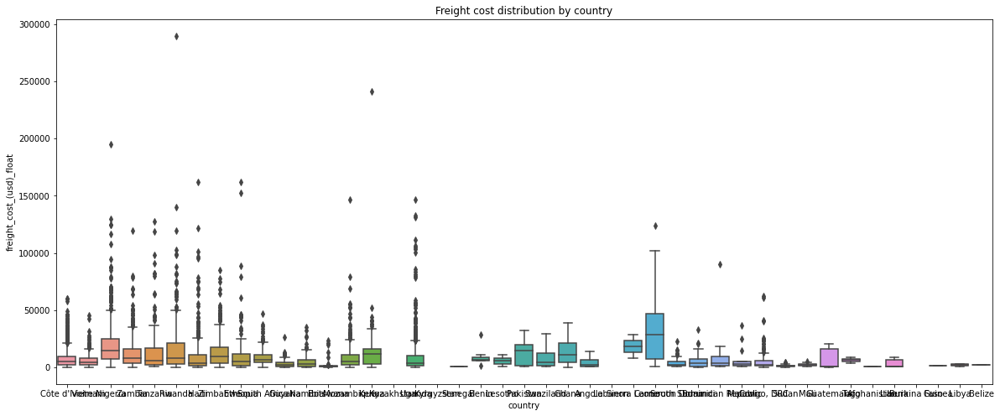

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt 
plt.figure(figsize=[20,8])
sns.boxplot(x ='country' ,y='freight_cost_(usd)_float', data=df_fcd)
plt.title('Freight cost distribution by country')

## B. 
Plot the number of delivered shipments over time. Decide if you want to use weeks, months or another unit.


In [ ]:
df.head()

,id,project code,pq #,po / so #,asn/dn #,country,managed by,fulfill via,vendor inco term,shipment mode,...,unit of measure (per pack),line item quantity,line item value,pack price,unit price,manufacturing site,first line designation,weight (kilograms),freight cost (usd),line item insurance (usd)
0,1,100-CI-T01,Pre-PQ Process,SCMS-4,ASN-8,Côte d'Ivoire,PMO - US,Direct Drop,EXW,Air,...,30,19,551.0,29.00,0.97,Ranbaxy Fine Chemicals LTD,True,13,780.34,NaN
1,3,108-VN-T01,Pre-PQ Process,SCMS-13,ASN-85,Vietnam,PMO - US,Direct Drop,EXW,Air,...,240,1000,6200.0,6.20,0.03,"Aurobindo Unit III, India",True,358,4521.5,NaN
2,4,100-CI-T01,Pre-PQ Process,SCMS-20,ASN-14,Côte d'Ivoire,PMO - US,Direct Drop,FCA,Air,...,100,500,40000.0,80.00,0.80,ABBVIE GmbH & Co.KG Wiesbaden,True,171,1653.78,NaN
3,15,108-VN-T01,Pre-PQ Process,SCMS-78,ASN-50,Vietnam,PMO - US,Direct Drop,EXW,Air,...,60,31920,127360.8,3.99,0.07,"Ranbaxy, Paonta Shahib, India",True,1855,16007.06,NaN
4,16,108-VN-T01,Pre-PQ Process,SCMS-81,ASN-55,Vietnam,PMO - US,Direct Drop,EXW,Air,...,60,38000,121600.0,3.20,0.05,"Aurobindo Unit III, India",True,7590,45450.08,NaN


In [ ]:
df_q2_sub = df.copy()

In [ ]:
df_q2_sub = df_q2_sub.sort_values(by=['scheduled delivery date', 'delivered to client date','delivery recorded date'])

In [ ]:
df_q2_sub = df_q2_sub[['delivered to client date','line item quantity' ]]

In [ ]:
df_q2_sub.columns = ['delivery_date', 'li_qty']
df_q2_sub['delivery_date'] = pd.to_datetime(df_q2_sub['delivery_date'])
df_q2_sub.set_index('delivery_date', inplace=True)
df_q2_sub.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10324 entries, 2008-04-01 to 2015-08-04
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   li_qty  10324 non-null  int64
dtypes: int64(1)
memory usage: 161.3 KB


In [ ]:
import plotly.express as px
import pandas as pd

df_q2_resampled = df_q2_sub.resample(rule='W').sum()


fig = px.line(df_q2_resampled, x=df_q2_resampled.index, y='li_qty', title='Weekly Total of Line Items Delivered')

fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [ ]:
import plotly.express as px
import pandas as pd

df_q2_resampled = df_q2_sub.resample(rule='M').sum()


fig = px.line(df_q2_resampled, x=df_q2_resampled.index, y='li_qty', title='Monthly Total of Line Items Delivered ')

fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [ ]:
import plotly.express as px
import pandas as pd

df_q2_resampled = df_q2_sub.resample(rule='Q').sum()


fig = px.line(df_q2_resampled, x=df_q2_resampled.index, y='li_qty', title='Quartely Total of Line Items Delivered ')

fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [ ]:
import plotly.express as px
import pandas as pd

df_q2_resampled = df_q2_sub.resample(rule='Y').sum()


fig = px.line(df_q2_resampled, x=df_q2_resampled.index, y='li_qty', title='Yearly Total of Line Items Delivered ')

fig.update_xaxes(rangeslider_visible=True)
fig.show()

## Answer
Above graphs show that using Monthly or Yearly Frequencies are  good descriptors for year wise data view. However, we might need to analyze each year for trends

## C. 
What other observations can you make from the data

### Attempting to Plot data yearwise by country

In [ ]:
df_ctry = df[['country', 'line item quantity', 'delivered to client date']].copy()
df_ctry.columns = ['country', 'li_qty', 'delivery_date']
df_ctry.delivery_date = pd.to_datetime(df_ctry.delivery_date)
df_ctry.set_index('delivery_date', inplace=True)
df_ctry_resam = df_ctry.resample(rule='Q').sum()


In [ ]:
df_ctry_vietnam = df_ctry[df_ctry['country'] == 'Vietnam']

In [ ]:
#df_ctry_vietnam.set_index('delivery_date', inplace=True)

df_q2_resampled = df_ctry_vietnam.resample(rule='M').sum()


fig = px.line(df_q2_resampled, x=df_q2_resampled.index, y='li_qty', title='Monthly Total of Line Items Delivered for Vietnam')

fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [ ]:
##

### Top 5 countries based on Value counts

In [ ]:
df_ctry_sum = df_ctry.groupby('country').count()
df_ctry_sum = df_ctry_sum.sort_values(by=['li_qty'], ascending=False)
df_ctry_sum.columns = ['counts']

In [ ]:
import plotly.express as px
fig = px.bar(df_ctry_sum, x=df_ctry_sum.index, y='counts', title='Countries by Value Counts')
fig.show()

In [ ]:
print('Top 5 countries with by Value Counts')
df_ctry_sum.head(5)

Top 5 countries with by Value Counts


,counts
country,
South Africa,1406
Nigeria,1194
Côte d'Ivoire,1083
Uganda,779
Vietnam,688


### Shipment Modes

In [ ]:
df_sm = df[['country', 'shipment mode']].copy()


In [ ]:
## Replacing NaN with Not Available 

df_sm['shipment mode'].fillna('Not Available', inplace=True)

In [ ]:
df_sm = df_sm.groupby(['shipment mode']).count()
df_sm.columns = ['counts']

In [ ]:
px.pie(df_sm, values='counts', names=df_sm.index, title='Shipment Modes')


### Top 10 manufacturing Sites by Modes

In [ ]:
df_tms=df.groupby('manufacturing site').size().nlargest(10)


In [ ]:

fig = px.bar(df_tms, title='Countries by Value Counts')
fig.show()

## D. 
Fit a model of your choice to the freight cost. Explain what assumptions you make and answer these questions

### EDA and Data Profilling

In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df, title='SCM Data', html={'style':{'full_width':True}})
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Feature Analysis

Utilising Metadata from https://data.usaid.gov/HIV-AIDS/Supply-Chain-Shipment-Pricing-Data/a3rc-nmf6

#### Quick Correlation Analysis

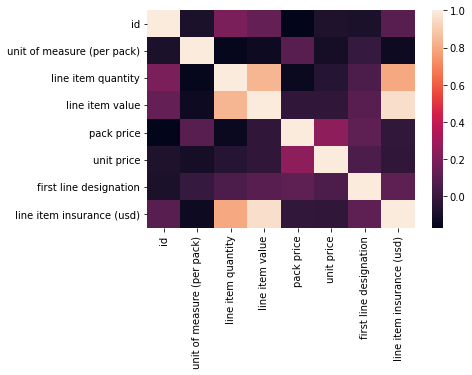

In [ ]:
import scipy
import seaborn as sns
sns.heatmap(df.corr())

In [ ]:
df1 = df.copy()
df1 = df1.drop(['id'], axis=1)

#### Check Missing Values

In [ ]:
df1.isnull().sum()
## Method 1 
missval = df.isna().sum()
print('Columns & Missing values')
print('------------------------')
print(missval[missval > 0])

# It is observed that Dosage has the maximum NaNs followed by shipment mode
# line item insurance

Columns & Missing values
------------------------
shipment mode                 360
dosage                       1736
line item insurance (usd)     287
dtype: int64


#### Analyzing the target variable for Non Numeric **values**

In [ ]:
df[df.id == 10566]


,id,project code,pq #,po / so #,asn/dn #,country,managed by,fulfill via,vendor inco term,shipment mode,...,unit of measure (per pack),line item quantity,line item value,pack price,unit price,manufacturing site,first line designation,weight (kilograms),freight cost (usd),line item insurance (usd)
1045,10566,112-NG-T01,Pre-PQ Process,SO-557,DN-172,Nigeria,PMO - US,From RDC,N/A - From RDC,NaN,...,60,880,2912.8,3.31,0.06,"Ranbaxy, Paonta Shahib, India",True,226,1732,NaN


In [ ]:
df[df['asn/dn #'] == 'DN-172']

,id,project code,pq #,po / so #,asn/dn #,country,managed by,fulfill via,vendor inco term,shipment mode,...,unit of measure (per pack),line item quantity,line item value,pack price,unit price,manufacturing site,first line designation,weight (kilograms),freight cost (usd),line item insurance (usd)
1045,10566,112-NG-T01,Pre-PQ Process,SO-557,DN-172,Nigeria,PMO - US,From RDC,N/A - From RDC,NaN,...,60,880,2912.80,3.31,0.06,"Ranbaxy, Paonta Shahib, India",True,226,1732,NaN
1234,10833,112-NG-T01,Pre-PQ Process,SO-557,DN-172,Nigeria,PMO - US,From RDC,N/A - From RDC,NaN,...,60,1198,4276.86,3.57,0.06,"Strides, Bangalore, India.",False,See DN-172 (ID#:10566),See DN-172 (ID#:10566),NaN
2089,12063,112-NG-T01,Pre-PQ Process,SO-557,DN-172,Nigeria,PMO - US,From RDC,N/A - From RDC,NaN,...,60,203,2168.04,10.68,0.18,"Aurobindo Unit III, India",False,See DN-172 (ID#:10566),See DN-172 (ID#:10566),NaN
2090,12064,112-NG-T01,Pre-PQ Process,SO-557,DN-172,Nigeria,PMO - US,From RDC,N/A - From RDC,NaN,...,60,1799,13492.50,7.50,0.12,"Cipla, Goa, India",False,See DN-172 (ID#:10566),See DN-172 (ID#:10566),NaN


In [ ]:

df[df['asn/dn #'] == 'ASN-3562']

,id,project code,pq #,po / so #,asn/dn #,country,managed by,fulfill via,vendor inco term,shipment mode,...,unit of measure (per pack),line item quantity,line item value,pack price,unit price,manufacturing site,first line designation,weight (kilograms),freight cost (usd),line item insurance (usd)
87,960,108-VN-T01,Pre-PQ Process,SCMS-37170,ASN-3562,Vietnam,PMO - US,Direct Drop,EXW,Air,...,60,5964,51350.04,8.61,0.14,"Aurobindo Unit III, India",True,3509,12835.2,100.65
88,961,108-VN-T01,Pre-PQ Process,SCMS-37170,ASN-3562,Vietnam,PMO - US,Direct Drop,EXW,Air,...,60,21000,50400.00,2.40,0.04,"Aurobindo Unit III, India",False,See ASN-3562 (ID#:960),See ASN-3562 (ID#:960),98.78
235,2298,108-VN-T01,Pre-PQ Process,SCMS-37170,ASN-3562,Vietnam,PMO - US,Direct Drop,EXW,Air,...,60,700,7805.00,11.15,0.19,"Aurobindo Unit III, India",False,See ASN-3562 (ID#:960),See ASN-3562 (ID#:960),15.30
484,4921,108-VN-T01,Pre-PQ Process,SCMS-37170,ASN-3562,Vietnam,PMO - US,Direct Drop,EXW,Air,...,60,5200,15080.00,2.90,0.05,"Aurobindo Unit III, India",False,See ASN-3562 (ID#:960),See ASN-3562 (ID#:960),29.56
978,10229,108-VN-T01,Pre-PQ Process,SCMS-37170,ASN-3562,Vietnam,PMO - US,Direct Drop,EXW,Air,...,60,22428,32520.60,1.45,0.02,"Aurobindo Unit III, India",False,See ASN-3562 (ID#:960),See ASN-3562 (ID#:960),63.74


In [ ]:
df1[df1['freight cost (usd)'] == 'See ASN-3562 (ID#:960)']

,project code,pq #,po / so #,asn/dn #,country,managed by,fulfill via,vendor inco term,shipment mode,pq first sent to client date,...,unit of measure (per pack),line item quantity,line item value,pack price,unit price,manufacturing site,first line designation,weight (kilograms),freight cost (usd),line item insurance (usd)
88,108-VN-T01,Pre-PQ Process,SCMS-37170,ASN-3562,Vietnam,PMO - US,Direct Drop,EXW,Air,Pre-PQ Process,...,60,21000,50400.0,2.40,0.04,"Aurobindo Unit III, India",False,See ASN-3562 (ID#:960),See ASN-3562 (ID#:960),98.78
235,108-VN-T01,Pre-PQ Process,SCMS-37170,ASN-3562,Vietnam,PMO - US,Direct Drop,EXW,Air,Pre-PQ Process,...,60,700,7805.0,11.15,0.19,"Aurobindo Unit III, India",False,See ASN-3562 (ID#:960),See ASN-3562 (ID#:960),15.30
484,108-VN-T01,Pre-PQ Process,SCMS-37170,ASN-3562,Vietnam,PMO - US,Direct Drop,EXW,Air,Pre-PQ Process,...,60,5200,15080.0,2.90,0.05,"Aurobindo Unit III, India",False,See ASN-3562 (ID#:960),See ASN-3562 (ID#:960),29.56
978,108-VN-T01,Pre-PQ Process,SCMS-37170,ASN-3562,Vietnam,PMO - US,Direct Drop,EXW,Air,Pre-PQ Process,...,60,22428,32520.6,1.45,0.02,"Aurobindo Unit III, India",False,See ASN-3562 (ID#:960),See ASN-3562 (ID#:960),63.74


#### Observation 
On observing the target variable, we can see that all non numeric values are being charged under the same asn/dn #. Thus it will be safe to drop the non numeric values are keep the float ones.

In [ ]:
df1 = df[pd.to_numeric(df['freight cost (usd)'], errors='coerce').notnull()]

In [ ]:
print('Original Data :', df.shape)
print('New Data Post dropping categorical data : ', df1.shape)

Original Data : (10324, 33)
New Data Post dropping categorical data :  (6198, 33)


In [ ]:
df1['freight cost (usd)'] = pd.to_numeric(df1['freight cost (usd)'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### Checking the Skew of target

Text(0.5, 1.0, 'Cbrt-Transformed Data')

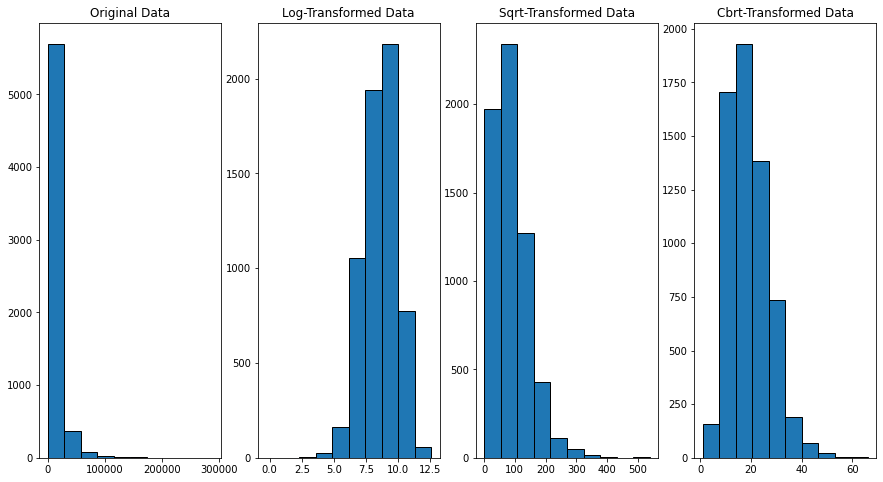

In [ ]:
data = df1['freight cost (usd)']

import numpy as np
import matplotlib.pyplot as plt

#make this example reproducible
np.random.seed(0)

#create beta distributed random variable with 200 values
# data = np.random.beta(a=4, b=15, size=300)

#create log-transformed data
data_log = np.log(data)
data_sqrt = np.sqrt(data)
data_cbrt = np.cbrt(data)

#define grid of plots
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=[15,8])

#create histograms
axs[0].hist(data, edgecolor='black')
axs[1].hist(data_log, edgecolor='black')
axs[2].hist(data_sqrt, edgecolor='black')
axs[3].hist(data_cbrt, edgecolor='black')

#add title to each histogram
axs[0].set_title('Original Data')
axs[1].set_title('Log-Transformed Data')
axs[2].set_title('Sqrt-Transformed Data')
axs[3].set_title('Cbrt-Transformed Data')

It is evident that Cube root transformation is the best suited for normalizing the skew

#### Normalizing the Target

In [ ]:
df1['freight cost (usd)'] = np.cbrt(df1['freight cost (usd)'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df1[df1['dosage'].isna()][[ 
       'item description', 'dosage',
       'dosage form']].drop_duplicates()

,item description,dosage,dosage form
0,"HIV, Reveal G3 Rapid HIV-1 Antibody Test, 30 T...",NaN,Test kit
2,"HIV 1/2, Determine Complete HIV Kit, 100 Tests",NaN,Test kit
11,"HIV 1/2, Uni-Gold HIV Kit, 20 Tests",NaN,Test kit
17,"HIV 1/2/O, First Response HIV 1-2.0, v.3.0 Car...",NaN,Test kit
21,"HIV 1/2, Stat-Pak HIV, Kit, 20 Tests",NaN,Test kit
25,"HIV 1/2, Determine HIV Kit, without Lancets, 1...",NaN,Test kit
26,"HIV 1/2, OraQuick Advance HIV Rapid Antibody K...",NaN,Test kit
27,"HIV 1/2, Bioline 3.0 Kit, Lancets, Capillary p...",NaN,Test kit
35,"HIV, Lancet, Safety, for HIV Test kits, 100 Pcs",NaN,Test kit - Ancillary
39,"#108853** HIV, Genie II HIV-1/HIV-2 Kit, 40 Tests",NaN,Test kit


It is observed that for Test Kits, the Dosage is missing 

In [ ]:
## Dropping rows with Non Numeric data in columns
for val in df1['weight (kilograms)'].unique():
  try:
    float(val)
  except:
    print(val)

Weight Captured Separately


#### Pre-processing

In [ ]:
# Binary Incoding 
df1['first line designation'] = df1['first line designation'].replace({False: 0, True: 1})

# Imputing Values
df1['line item insurance (usd)'] = df1['line item insurance (usd)'].fillna(df1['line item insurance (usd)'].mean())

### Approach 1: 
Modelling Using numeric data only

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split


exp1 = df1.select_dtypes(exclude=['object'])
y = exp1['freight cost (usd)']
exp1.drop(['freight cost (usd)'], axis=1, inplace=True)

# Break off validation set from training data
X_train, X_valid, y_train, y_valid = train_test_split(exp1, y, train_size=0.8, test_size=0.2,
                                                      random_state=0)
X_train.head()


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,unit of measure (per pack),line item quantity,line item value,pack price,unit price,line item insurance (usd)
9068,60,1005,2341.65,2.33,0.04,3.28
4952,100,1470,117600.00,80.00,0.80,120.89
7672,30,91166,375603.92,4.12,0.14,526.60
5156,60,40860,95612.40,2.34,0.04,134.05
1537,100,1800,18.00,0.01,0.00,0.03


##### Evaluation

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.metrics import r2_score

model = RandomForestRegressor(n_estimators=100, random_state=0)
model.fit(X_train, y_train)
preds = model.predict(X_valid)
print("MAE from Approach 1 (Drop categorical variables):", mean_absolute_error(y_valid, preds))
print("MSE from Approach 1 (Drop categorical Variables):", mean_squared_error(y_valid, preds))
print("R2  from Approach 1 (Drop categorical Variables):", r2_score(y_valid, preds))

MAE from Approach 1 (Drop categorical variables): 3.9834043310026397
MSE from Approach 1 (Drop categorical Variables): 31.307503943534044
R2  from Approach 1 (Drop categorical Variables): 0.5340263641861269


#### Calculating Feature Importance

In [ ]:
import time
import numpy as np

start_time = time.time()
importance = model.feature_importances_
std = np.std([tree.feature_importances_ for tree in model.estimators_], axis=0)
elapsed_time = time.time() - start_time

print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

Elapsed time to compute the importances: 0.032 seconds


Elapsed time to compute the importances: 0.026 seconds
Index(['unit of measure (per pack)', 'line item quantity', 'line item value',
       'pack price', 'unit price', 'line item insurance (usd)'],
      dtype='object')
Feature: 0, Score: 0.03858, Name : unit of measure (per pack)
Feature: 1, Score: 0.19812, Name : line item quantity
Feature: 2, Score: 0.46217, Name : line item value
Feature: 3, Score: 0.08262, Name : pack price
Feature: 4, Score: 0.08293, Name : unit price
Feature: 5, Score: 0.13559, Name : line item insurance (usd)


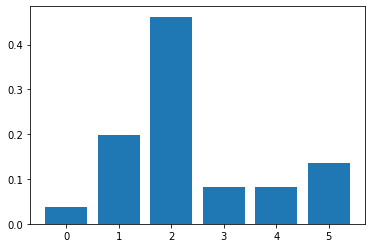

In [ ]:
import matplotlib.pyplot as pyplot
import time
import numpy as np

start_time = time.time()
importance = model.feature_importances_
std = np.std([tree.feature_importances_ for tree in model.estimators_], axis=0)
elapsed_time = time.time() - start_time

print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")
print(X_train.columns)
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f, Name : %s' % (i,v,X_train.columns[i] ))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

### Observation
1. Current predictive power is at 53% with just numeric predictors

2. It is evident that Line Item Value has the most influence in the prediction of the freight value

## Approach 2: 
Adding Categorical Variables and Date variables with low cardinality

In [ ]:
## Handling Missing Values for Shipment Mode
df1['shipment mode'].fillna('Not Available', inplace=True)

## Filling Dosage Empty values with NA since they are test kits
df1['dosage'].fillna('NA', inplace=True)

In [ ]:
df1[df1['dosage'].isna()][[ 
       'item description', 'dosage',
       'dosage form']].drop_duplicates()

,item description,dosage,dosage form


In [ ]:
#df1 = df1.drop('project code', axis=1)

In [ ]:
# Drop high-cardinality columns
df1 = df1.drop(['pq #', 'po / so #', 'asn/dn #'], axis=1)

In [ ]:
# Extract date features
for column in ['scheduled delivery date', 'delivered to client date', 'delivery recorded date']:
    df1[column] = pd.to_datetime(df1[column])
    df1[column + ' Year'] = df1[column].apply(lambda x: x.year)
    df1[column + ' Month'] = df1[column].apply(lambda x: x.month)
    df1[column + ' Day'] = df1[column].apply(lambda x: x.day)
    df1 = df1.drop(column, axis=1)

In [ ]:
df1 = df1.drop(['pq first sent to client date', 'po sent to vendor date', 'item description'], axis=1)


In [ ]:
df1

,project code,country,managed by,fulfill via,vendor inco term,shipment mode,product group,sub classification,vendor,molecule/test type,...,line item insurance (usd),scheduled delivery date Year,scheduled delivery date Month,scheduled delivery date Day,delivered to client date Year,delivered to client date Month,delivered to client date Day,delivery recorded date Year,delivery recorded date Month,delivery recorded date Day
0,100-CI-T01,Côte d'Ivoire,PMO - US,Direct Drop,EXW,Air,HRDT,HIV test,RANBAXY Fine Chemicals LTD.,"HIV, Reveal G3 Rapid HIV-1 Antibody Test",...,296.665788,2006,6,2,2006,6,2,2006,6,2
1,108-VN-T01,Vietnam,PMO - US,Direct Drop,EXW,Air,ARV,Pediatric,Aurobindo Pharma Limited,Nevirapine,...,296.665788,2006,11,14,2006,11,14,2006,11,14
2,100-CI-T01,Côte d'Ivoire,PMO - US,Direct Drop,FCA,Air,HRDT,HIV test,Abbott GmbH & Co. KG,"HIV 1/2, Determine Complete HIV Kit",...,296.665788,2006,8,27,2006,8,27,2006,8,27
3,108-VN-T01,Vietnam,PMO - US,Direct Drop,EXW,Air,ARV,Adult,SUN PHARMACEUTICAL INDUSTRIES LTD (RANBAXY LAB...,Lamivudine,...,296.665788,2006,9,1,2006,9,1,2006,9,1
4,108-VN-T01,Vietnam,PMO - US,Direct Drop,EXW,Air,ARV,Adult,Aurobindo Pharma Limited,Stavudine,...,296.665788,2006,8,11,2006,8,11,2006,8,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10305,111-MZ-T30,Mozambique,PMO - US,From RDC,N/A - From RDC,Truck,ARV,Adult,SCMS from RDC,Lamivudine/Nevirapine/Zidovudine,...,2725.930000,2015,5,29,2015,6,9,2015,6,15
10306,111-MZ-T30,Mozambique,PMO - US,From RDC,N/A - From RDC,Truck,ARV,Adult,SCMS from RDC,Lamivudine/Tenofovir Disoproxil Fumarate,...,75.520000,2015,5,29,2015,6,15,2015,6,15
10310,114-UG-T30,Uganda,PMO - US,From RDC,N/A - From RDC,Truck,ARV,Pediatric,SCMS from RDC,Lamivudine/Nevirapine/Zidovudine,...,76.270000,2015,6,30,2015,6,4,2015,6,15
10315,151-NG-T30,Nigeria,PMO - US,From RDC,N/A - From RDC,Air Charter,ARV,Adult,SCMS from RDC,Lopinavir/Ritonavir,...,1341.330000,2015,6,30,2015,5,15,2015,5,22


In [ ]:
# Binary encoding
df1['fulfill via'] = df1['fulfill via'].replace({'Direct Drop': 0, 'From RDC': 1})
df1['first line designation'] = df1['first line designation'].replace({'No': 0, 'Yes': 1})


In [ ]:
## Label Encoding
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

df1['country_encoded'] = le.fit_transform(df1["country"])
df1[["country", "country_encoded"]].drop_duplicates().sort_values(['country_encoded']).head(39)
df1 = df1.drop('country', axis=1)

df1['vendor inco term'] = le.fit_transform(df1['vendor inco term'])


In [ ]:
df1['managed by'].unique()

array(['PMO - US', 'Haiti Field Office'], dtype=object)

In [ ]:
df1.select_dtypes('object').columns

Index(['project code', 'managed by', 'shipment mode', 'product group',
       'sub classification', 'vendor', 'molecule/test type', 'brand', 'dosage',
       'dosage form', 'manufacturing site', 'weight (kilograms)'],
      dtype='object')

In [ ]:
## Dropping rows with Non Numeric data in columns
for val in df1['weight (kilograms)'].unique():
  try:
    float(val)
  except:
    print(val)

Weight Captured Separately


In [ ]:
idx = df1[df1['weight (kilograms)'] == 'Weight Captured Separately'].index


In [ ]:
df1 = df1.drop(idx, axis=0).reset_index(drop=True)

In [ ]:
df1['weight (kilograms)'] = pd.to_numeric(df1['weight (kilograms)'])

In [ ]:
print('Checking Cardinality of the columns \n')
from tabulate import tabulate
mainlst = []
for i in df1.select_dtypes('object').columns:
  mainlst.append([i, df1[i].nunique()])
print(tabulate(mainlst, headers=['Column Name', 'Cardinality']))

Checking Cardinality of the columns 

Column Name           Cardinality
------------------  -------------
project code                  130
managed by                      2
shipment mode                   5
product group                   5
sub classification              6
vendor                         52
molecule/test type             82
brand                          43
dosage                         53
dosage form                    17
manufacturing site             75


In [ ]:
# One hot encoding remaining categorical variables
for column in df1.select_dtypes('object').columns:
    dummies = pd.get_dummies(df1[column], prefix=column)
    df1 = pd.concat([df1, dummies], axis=1)
    df1 = df1.drop(column, axis=1)

In [ ]:
print('Original : ', df1['freight cost (usd)'].skew())
data_cbrt.skew()

Original :  0.8109093595239346


0.8128865339131887

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split


# df1 = df1.drop('id', axis=1)
exp1 = df1.copy()
y = exp1['freight cost (usd)']
exp1.drop(['freight cost (usd)'], axis=1, inplace=True)

# Break off validation set from training data
X_train, X_valid, y_train, y_valid = train_test_split(exp1, y, train_size=0.8, test_size=0.2,
                                                      random_state=0)



In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler 

scaler = StandardScaler()
# scaler.fit(X_train)
# X_train = pd.DataFrame(scaler.transform(X_train), index=X_train.index, columns=X_train.columns)
# X_valid = pd.DataFrame(scaler.transform(X_valid), index=X_valid.index, columns=X_valid.columns)


model = RandomForestRegressor(n_estimators=100, random_state=0)
model.fit(X_train, y_train)
preds = model.predict(X_valid)
print("MAE from Approach 2 (Encoding Categorical Features):", mean_absolute_error(y_valid, preds))
print("MSE from Approach 2 (Encoding Categorical Features):", mean_squared_error(y_valid, preds))
print("R2  from Approach 2 (Encoding Categorical Features):", r2_score(y_valid, preds))

MAE from Approach 2 (Encoding Categorical Features): 2.441148594408149
MSE from Approach 2 (Encoding Categorical Features): 14.441043445188756
R2  from Approach 2 (Encoding Categorical Features): 0.7766337529941811


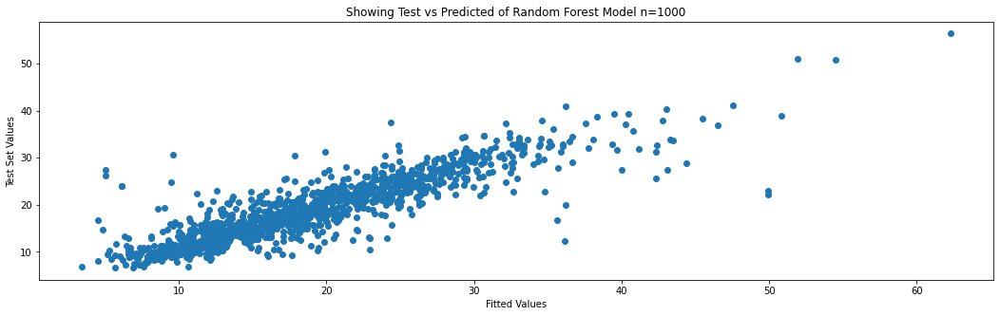

In [ ]:
import matplotlib.pyplot as plt
f, ax = plt.subplots(figsize=(18,5))
df_show = pd.DataFrame()
df_show['testset'] = y_valid 
df_show['pred'] = preds 
plt.scatter(y_valid,preds)
plt.ylabel('Test Set Values')
plt.xlabel('Fitted Values')
plt.title('Showing Test vs Predicted of Random Forest Model n=1000')
plt.show()

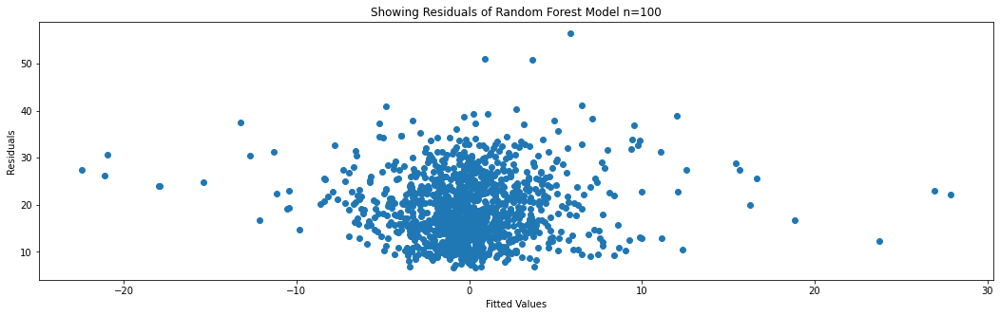

In [ ]:
import matplotlib.pyplot as plt
f, ax = plt.subplots(figsize=(18,5))

plt.scatter(y_valid-preds,preds)
plt.ylabel('Residuals')
plt.xlabel('Fitted Values')
plt.title('Showing Residuals of Random Forest Model n=100')
plt.show()

In [ ]:
#pip install scipy

### Observation


Top 10 important features : 

weight (kilograms)
line item quantity
shipment mode_Air Charter
line item value
country_encoded
line item insurance (usd)
product group_ARV
shipment mode_Truck
pack price
shipment mode_Air


Elapsed time to compute the importances: 0.028 seconds
Feature: 1, Score: 0.01259 , Name : vendor inco term
Feature: 3, Score: 0.02406 , Name : line item quantity
Feature: 4, Score: 0.02364 , Name : line item value
Feature: 5, Score: 0.01343 , Name : pack price
Feature: 6, Score: 0.01201 , Name : unit price
Feature: 8, Score: 0.56657 , Name : weight (kilograms)
Feature: 9, Score: 0.01703 , Name : line item insurance (usd)
Feature: 10, Score: 0.01169 , Name : scheduled delivery date Year
Feature: 12, Score: 0.01185 , Name : scheduled delivery date Day
Feature: 15, Score: 0.01116 , Name : delivered to client date Day
Feature: 16, Score: 0.01093 , Name : delivery recorded date Year
Feature: 18, Score: 0.01016 , Name : delivery recorded date Day
Feature: 19, Score: 0.02210

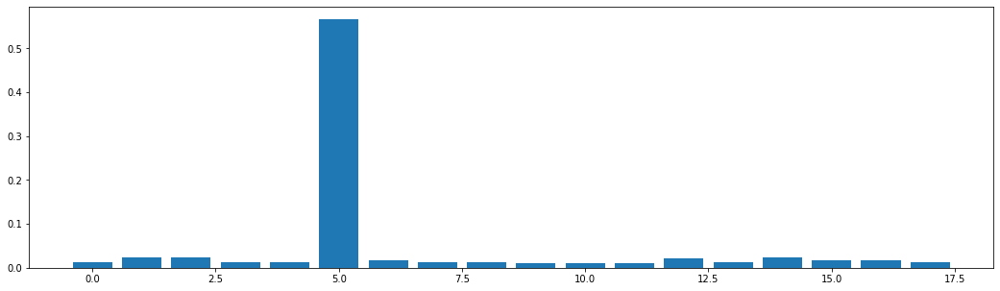

In [ ]:
import matplotlib.pyplot as pyplot
import time
import numpy as np

start_time = time.time()
importance = model.feature_importances_
std = np.std([tree.feature_importances_ for tree in model.estimators_], axis=0)
elapsed_time = time.time() - start_time
idx = (-importance).argsort()[:10]

print('Top 10 important features : \n')

for i in idx:
  print(X_train.columns[i])
print('\n')
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")
# summarize feature importance
imp_new = []
imp_new_cols = []
for i,v in enumerate(importance):
  if v > 0.01:
    print('Feature: %0d, Score: %.5f , Name : %s' % (i,v,X_train.columns[i]))
    imp_new.append(v)
    imp_new_cols.append(X_train.columns[i])
# plot feature importance
f, ax = pyplot.subplots(figsize=(18,5))
pyplot.bar([x for x in range(len(imp_new))], imp_new)
pyplot.show()



In [ ]:
#pip install configparser

## Conclusion:

### 1. Following features appear to be good predictors:

In [ ]:
idx = (-importance).argsort()[:10]
for i in idx:
  print(X_train.columns[i])

weight (kilograms)
line item quantity
shipment mode_Air Charter
line item value
country_encoded
line item insurance (usd)
product group_ARV
shipment mode_Truck
pack price
shipment mode_Air


### Accuracy of the Model

Since this is a regression problem, i need to provide R2 value which showcases the prediction power of the model. Currently i am able to reach 77%

Also,
Predict value need to cubed due to cube root transformation


Accuracy can be improved by adding exogenous features and talking to SME on how to represent the rows which had to be dropped because of categorical data in numerical columns

In [569]:
import pandas as pd

x = random.randint(0,60)

t1 = [random.randint(0,60) for a in range(0,24)]

df = pd.DataFrame(
        { 'incoming' : pd.date_range('2022-06-01', '2022-06-02', freq='1H', closed='left'),
          'Truck1': pd.date_range('2022-06-01', '2022-06-02', freq='1H', closed='left'),
         'Truck2' : pd.date_range('2022-06-01', '2022-06-02', freq='1H', closed='left')+pd.DateOffset( minutes=x)
        }
     )

inputlst = []
for i,val in enumerate(df.incoming):
  inputlst.append(val +pd.DateOffset( minutes=t1[i]))

df['incoming'] = inputlst
df


,incoming,Truck1,Truck2
0,2022-06-01 00:23:00,2022-06-01 00:00:00,2022-06-01 00:42:00
1,2022-06-01 01:14:00,2022-06-01 01:00:00,2022-06-01 01:42:00
2,2022-06-01 02:25:00,2022-06-01 02:00:00,2022-06-01 02:42:00
3,2022-06-01 03:08:00,2022-06-01 03:00:00,2022-06-01 03:42:00
4,2022-06-01 04:13:00,2022-06-01 04:00:00,2022-06-01 04:42:00
5,2022-06-01 05:44:00,2022-06-01 05:00:00,2022-06-01 05:42:00
6,2022-06-01 06:55:00,2022-06-01 06:00:00,2022-06-01 06:42:00
7,2022-06-01 07:02:00,2022-06-01 07:00:00,2022-06-01 07:42:00
8,2022-06-01 08:02:00,2022-06-01 08:00:00,2022-06-01 08:42:00
9,2022-06-01 09:50:00,2022-06-01 09:00:00,2022-06-01 09:42:00


In [587]:
mlst = []
for i, rows in df.iterrows():
  package = rows[0]
  t1 = rows[1]
  t2 = rows[2]
  # if arrival is > t2 departure, next t1 truck 
  if i < 23:
    if package > t2:
      waittime = df.iloc[i+1][1] - package
    elif package < t2:
      waittime = t2 - package
  elif i == 23:
    if package > t2:
      dt = package.date() + pd.DateOffset(days=1)
      waittime = dt - package
    elif package < t2:
      waittime = t2 - package    
  mlst.append(waittime)
df['difference'] = mlst

df.describe()

In [584]:
len(mlst)
df['difference'] = mlst

,difference
count,24
mean,0 days 00:20:47.500000
std,0 days 00:11:58.907685916
min,0 days 00:04:00
25%,0 days 00:10:00
50%,0 days 00:19:30
75%,0 days 00:32:15
max,0 days 00:40:00
